## Train

In [1]:
import json, random
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

jsonl_path = "/glob/g01-cache/pf/Yushuo/vjepa201/data/spar_sftqa_train.jsonl"
rows = [json.loads(l) for l in open(jsonl_path)]
print(f"Total rows: {len(rows)}")

Total rows: 11657660


unknown                        n=11657660


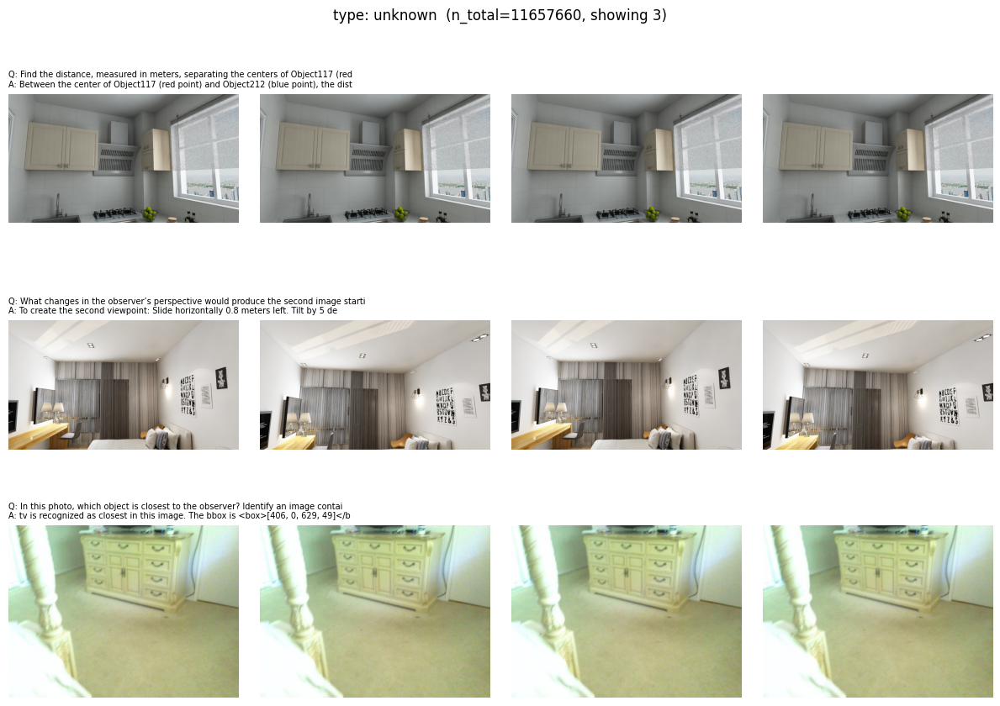

In [3]:
by_type = {}
for r in rows:
      t = r.get("type") or r.get("qa_kind", "unknown")
      by_type.setdefault(t, []).append(r)

for t, rs in sorted(by_type.items(), key=lambda kv: -len(kv[1])):
      print(f"{t:30s} n={len(rs)}")

  # 每类采样2-3个, 画图看query/target+图片
random.seed(0)
N_PER_TYPE = 3
MAX_IMGS = 4  # 每个样本最多显示几张图

for t, rs in by_type.items():
    sample = random.sample(rs, k=min(N_PER_TYPE, len(rs)))
    n = len(sample)
    fig, axes = plt.subplots(n, MAX_IMGS, figsize=(3 * MAX_IMGS, 3 * n), squeeze=False)

    for i, ex in enumerate(sample):
          imgs = ex["images"][:MAX_IMGS]
          for j in range(MAX_IMGS):
              ax = axes[i][j]
              ax.axis("off")
              if j < len(imgs):
                  ax.imshow(Image.open(imgs[j]))
              if j == 0:
                  cap = f"Q: {ex['query'][:80]}\nA: {ex['target'][:80]}"
                  ax.set_title(cap, fontsize=7, loc="left")

    fig.suptitle(f"type: {t}  (n_total={len(rs)}, showing {n})")
    fig.tight_layout()
    plt.show()

### check ori data 

In [5]:
import itertools

MAX_PER_FILE = 50  # 每个jsonl文件最多读这么多行
def iter_raw_rows_fast(spar_root, split, kinds, max_per_file=MAX_PER_FILE):
    for kind in kinds:
        for qa_path in sorted(spar_root.glob(f"*/qa_jsonl/{split}/*/{kind}/*.jsonl")):
            source = qa_path.relative_to(spar_root).parts[0]
            image_root = spar_root / source / "images"
            with open(qa_path, encoding="utf-8") as f:
                for line in itertools.islice(f, max_per_file):
                    if not line.strip():
                        continue
                    raw = json.loads(line)
                    conv = raw.get("conversations", [])
                    query = next((c["value"] for c in conv if c.get("from") == "human"), "")
                    target = next((c["value"] for c in conv if c.get("from") == "gpt"), "")
                    imgs = raw.get("image") or raw.get("sorted_image") or []
                    if isinstance(imgs, str):
                        imgs = [imgs]
                    if not query or not target or not imgs:
                        continue
                    yield {
                          "type": raw.get("type", "unknown"),
                          "qa_kind": kind,
                          "source": source,
                          "query": query,
                          "target": target,
                          "images": [str(image_root / p) for p in imgs],
                    }

raw_rows = list(iter_raw_rows_fast(spar_root, split, kinds))
print(f"Sampled rows: {len(raw_rows)}")

Sampled rows: 10531


In [6]:
by_type = {}
for r in raw_rows:
    t = r["type"]
    by_type.setdefault(t, []).append(r)

for t, rs in sorted(by_type.items(), key=lambda kv: -len(kv[1])):
    print(f"{t:30s} n={len(rs)}")

print(raw_rows[0].keys())
print(raw_rows[0])

distance_infer_center_oc_mv    n=750
depth_prediction_oc            n=450
depth_prediction_oc_mv         n=450
depth_prediction_oo            n=450
depth_prediction_oo_mv         n=450
distance_infer_center_oo_mv    n=450
distance_prediction_oc         n=450
distance_prediction_oc_mv      n=450
distance_prediction_oo_mv      n=450
camera_motion_infer            n=400
distance_prediction_oo         n=400
position_matching              n=400
distance_infer_center_oc       n=350
view_change_infer              n=350
distance_infer_center_oo       n=300
distance_infer_center_oo_video n=300
distance_prediction_oo_video   n=300
room_size                      n=300
spatial_volume_infer           n=300
obj_spatial_relation_oc_mv     n=250
obj_spatial_relation_oo_mv     n=250
spatial_imagination_oc         n=250
spatial_imagination_oc_mv      n=250
spatial_imagination_oo         n=250
spatial_imagination_oo_mv      n=250
appearance_order               n=200
obj_count                      n=200
o

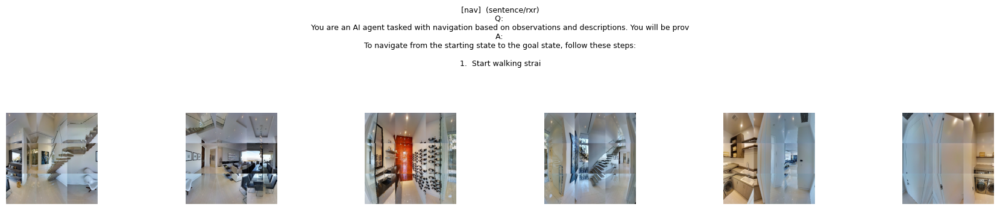

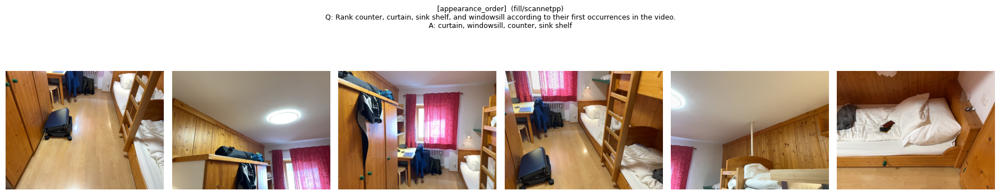

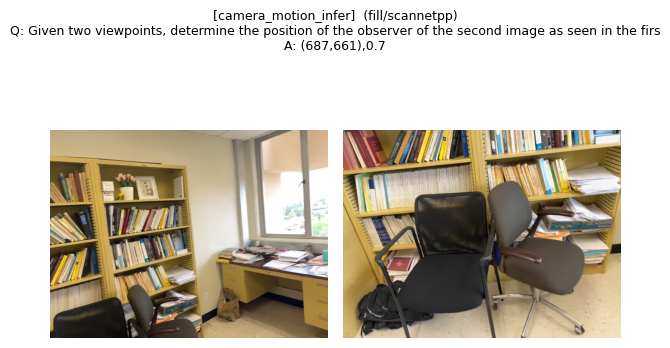

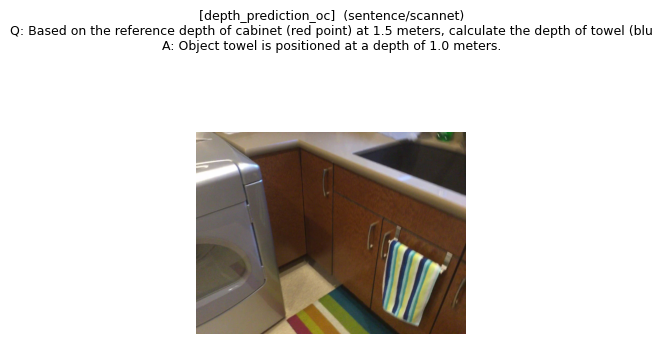

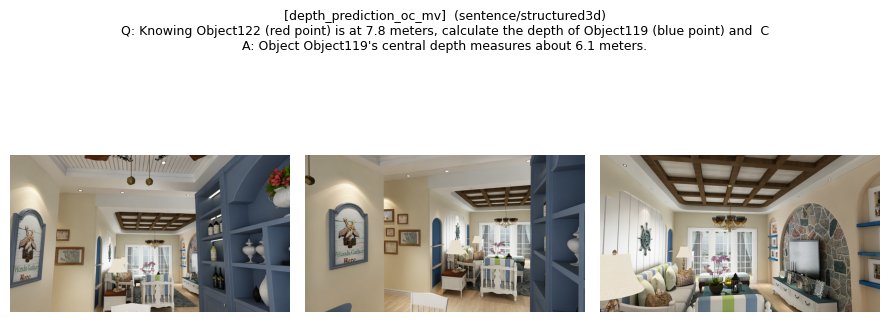

...

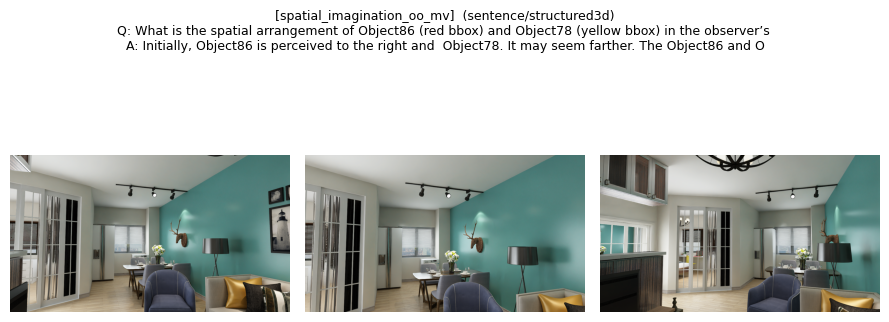

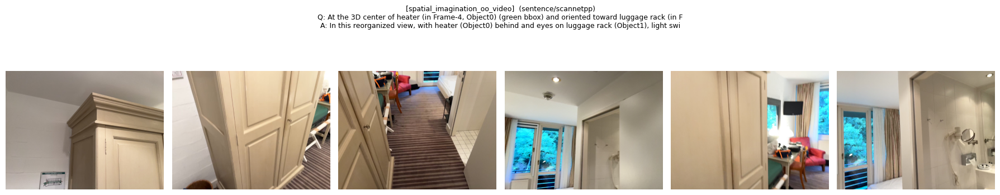

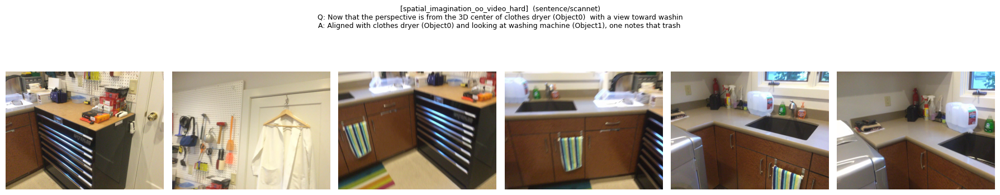

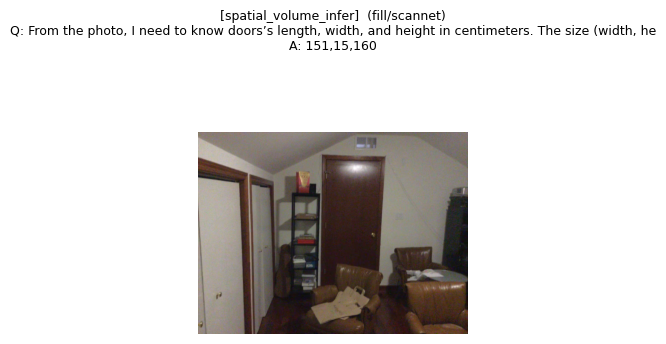

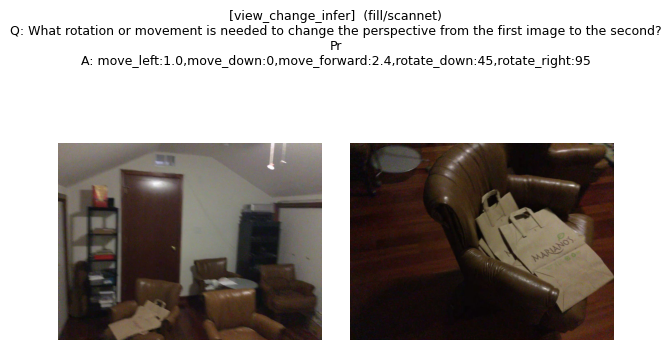

In [7]:
import random
random.seed(0)

MAX_IMGS = 6  # 每个例子最多显示几张图(nav类有6张)

for t, rs in by_type.items():
    ex = random.choice(rs)
    imgs = ex["images"][:MAX_IMGS]
    n = len(imgs)

    fig, axes = plt.subplots(1, n, figsize=(3 * n, 3), squeeze=False)
    for j in range(n):
        ax = axes[0][j]
        ax.axis("off")
        ax.imshow(Image.open(imgs[j]))

    fig.suptitle(
          f"[{t}]  ({ex['qa_kind']}/{ex['source']})\n"
          f"Q: {ex['query'][:100]}\nA: {ex['target'][:100]}",
          fontsize=9, y=1.15
    )
    fig.tight_layout()
    plt.show()